# White Fly Detection Model v1 Training

**Model:** MobileNetV2 Transfer Learning with Focal Loss

**Classes:** healthy, not_coconut, white_fly

**Date:** 2024-12-31

## 1. Setup and Imports

In [1]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import classification_report, confusion_matrix
import time
import json

print(f'TensorFlow version: {tf.__version__}')
print(f'GPU available: {len(tf.config.list_physical_devices("GPU")) > 0}')

TensorFlow version: 2.20.0
GPU available: True


## 2. Configuration

In [2]:
# Paths
BASE_DIR = r'D:\SLIIT\Reaserch Project\CoconutHealthMonitor\Research\ml'
DATA_DIR = os.path.join(BASE_DIR, 'datasets', 'coconut_white_fly')
MODEL_DIR = os.path.join(BASE_DIR, 'models', 'coconut_white_fly_v1')

TRAIN_DIR = os.path.join(DATA_DIR, 'train')
VAL_DIR = os.path.join(DATA_DIR, 'val')
TEST_DIR = os.path.join(DATA_DIR, 'test')

# Create model directory
os.makedirs(MODEL_DIR, exist_ok=True)

# Hyperparameters
IMG_SIZE = 224
BATCH_SIZE = 32
LEARNING_RATE_PHASE1 = 1e-3
LEARNING_RATE_PHASE2 = 1e-5
PHASE1_EPOCHS = 15
PHASE2_EPOCHS = 15

print('Configuration loaded!')
print(f'  Image size: {IMG_SIZE}x{IMG_SIZE}')
print(f'  Batch size: {BATCH_SIZE}')

Configuration loaded!
  Image size: 224x224
  Batch size: 32


## 3. Dataset Exploration

In [3]:
# Count images in each class
def count_images(directory):
    counts = {}
    for class_name in sorted(os.listdir(directory)):
        class_path = os.path.join(directory, class_name)
        if os.path.isdir(class_path):
            counts[class_name] = len([f for f in os.listdir(class_path) 
                                      if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
    return counts

train_counts = count_images(TRAIN_DIR)
val_counts = count_images(VAL_DIR)
test_counts = count_images(TEST_DIR)

print('Dataset Distribution:')
print('=' * 60)
print(f'{"Class":<20} {"Train":>10} {"Val":>10} {"Test":>10}')
print('-' * 60)
for class_name in train_counts:
    print(f'{class_name:<20} {train_counts[class_name]:>10} {val_counts.get(class_name, 0):>10} {test_counts.get(class_name, 0):>10}')
print('-' * 60)
print(f'{"TOTAL":<20} {sum(train_counts.values()):>10} {sum(val_counts.values()):>10} {sum(test_counts.values()):>10}')

Dataset Distribution:
Class                     Train        Val       Test
------------------------------------------------------------
healthy                     4410         45         45
not_coconut                 3985        291        185
white_fly                   3680         77         79
------------------------------------------------------------
TOTAL                     12075        413        309


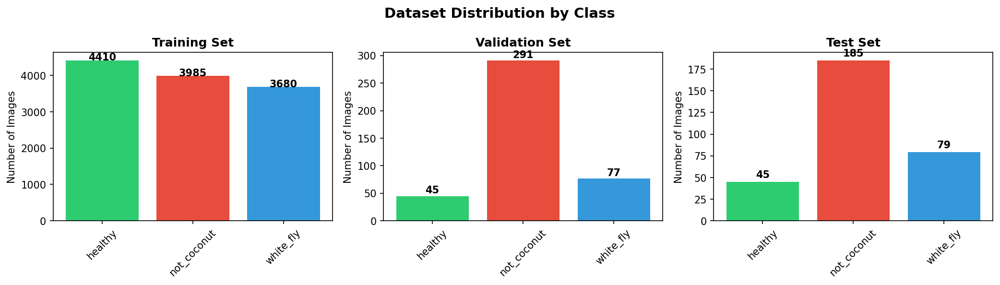

In [4]:
# Visualize dataset distribution
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for idx, (name, counts) in enumerate([('Train', train_counts), ('Validation', val_counts), ('Test', test_counts)]):
    classes = list(counts.keys())
    values = list(counts.values())
    colors = ['#2ecc71', '#95a5a6', '#e74c3c']
    
    bars = axes[idx].bar(classes, values, color=colors)
    axes[idx].set_title(f'{name} Set Distribution', fontweight='bold', fontsize=12)
    axes[idx].set_xlabel('Class')
    axes[idx].set_ylabel('Number of Images')
    
    for bar, val in zip(bars, values):
        axes[idx].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 50,
                      str(val), ha='center', va='bottom', fontweight='bold')

plt.suptitle('White Fly Dataset Distribution', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## 4. Data Preparation

In [5]:
# Data augmentation for training only
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    zoom_range=0.2,
    shear_range=0.1,
    fill_mode='nearest'
)

# No augmentation for validation and test
val_test_datagen = ImageDataGenerator(rescale=1./255)

# Create generators
train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True
)

val_generator = val_test_datagen.flow_from_directory(
    VAL_DIR,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

test_generator = val_test_datagen.flow_from_directory(
    TEST_DIR,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

class_names = list(train_generator.class_indices.keys())
print(f'Classes: {class_names}')
print(f'Class indices: {train_generator.class_indices}')

Found 12075 images belonging to 3 classes.
Found 413 images belonging to 3 classes.
Found 309 images belonging to 3 classes.
Classes: ['healthy', 'not_coconut', 'white_fly']
Class indices: {'healthy': 0, 'not_coconut': 1, 'white_fly': 2}


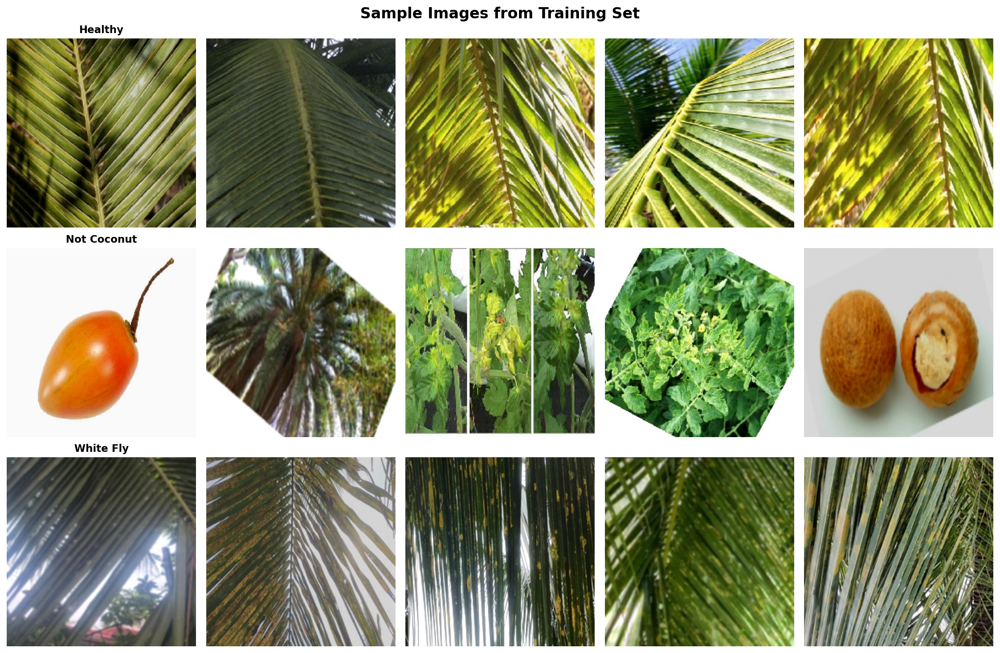

In [6]:
# Display sample images
fig, axes = plt.subplots(3, 5, figsize=(15, 10))

for row, class_name in enumerate(class_names):
    class_path = os.path.join(TRAIN_DIR, class_name)
    images = os.listdir(class_path)[:5]
    
    for col, img_name in enumerate(images):
        img_path = os.path.join(class_path, img_name)
        img = plt.imread(img_path)
        axes[row, col].imshow(img)
        axes[row, col].axis('off')
        if col == 0:
            axes[row, col].set_title(class_name.replace('_', ' ').title(), fontweight='bold')

plt.suptitle('Sample Images from Each Class', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## 5. Focal Loss Definition

In [7]:
import tensorflow.keras.backend as K

def focal_loss(gamma=2.0, alpha=0.25):
    """
    Focal Loss for handling class imbalance.
    
    Args:
        gamma: Focusing parameter (default=2.0)
        alpha: Class balancing parameter (default=0.25)
    """
    def focal_loss_fn(y_true, y_pred):
        epsilon = K.epsilon()
        y_pred = K.clip(y_pred, epsilon, 1. - epsilon)
        cross_entropy = -y_true * K.log(y_pred)
        weight = alpha * y_true * K.pow((1 - y_pred), gamma)
        loss = weight * cross_entropy
        return K.mean(K.sum(loss, axis=-1))
    return focal_loss_fn

print('Focal Loss defined with gamma=2.0, alpha=0.25')

Focal Loss defined with gamma=2.0, alpha=0.25


## 6. Build Model

In [8]:
# Load MobileNetV2 base model
base_model = MobileNetV2(
    weights='imagenet',
    include_top=False,
    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)

# Freeze base model initially
base_model.trainable = False

# Build classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.3)(x)
outputs = Dense(3, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=outputs)

print('Model built successfully!')
print(f'  Total layers: {len(model.layers)}')
print(f'  Base model trainable: {base_model.trainable}')
print(f'  Total parameters: {model.count_params():,}')

Model built successfully!
  Total layers: 158
  Base model trainable: False
  Total parameters: 2,585,411


## 7. Phase 1: Training with Frozen Base

In this phase, we train only the classification head while keeping MobileNetV2 frozen.

In [9]:
# Compile for Phase 1
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE_PHASE1),
    loss=focal_loss(gamma=2.0, alpha=0.25),
    metrics=['accuracy']
)

# Callbacks
callbacks_phase1 = [
    ModelCheckpoint(
        os.path.join(MODEL_DIR, 'best_model.keras'),
        monitor='val_accuracy',
        save_best_only=True,
        mode='max',
        verbose=1
    ),
    EarlyStopping(
        monitor='val_accuracy',
        patience=5,
        restore_best_weights=True,
        verbose=1
    )
]

print('Phase 1 Configuration:')
print(f'  Learning rate: {LEARNING_RATE_PHASE1}')
print(f'  Max epochs: {PHASE1_EPOCHS}')

Phase 1 Configuration:
  Learning rate: 0.001
  Max epochs: 15


In [10]:
# Phase 1 Training
print('\n' + '='*60)
print('PHASE 1: Training Classification Head (Frozen Base)')
print('='*60 + '\n')

start_time = time.time()

history_phase1 = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=PHASE1_EPOCHS,
    callbacks=callbacks_phase1
)

phase1_time = time.time() - start_time
print(f'\nPhase 1 completed in {phase1_time/60:.2f} minutes')


PHASE 1: Training Classification Head (Frozen Base)

Epoch 1/15
378/378 [==============================] - 206s 542ms/step - accuracy: 0.8234 - loss: 0.0273 - val_accuracy: 0.9741 - val_loss: 0.0089
Epoch 2/15
378/378 [==============================] - 203s 537ms/step - accuracy: 0.9412 - loss: 0.0121 - val_accuracy: 0.9773 - val_loss: 0.0074
Epoch 3/15
378/378 [==============================] - 202s 535ms/step - accuracy: 0.9534 - loss: 0.0098 - val_accuracy: 0.9806 - val_loss: 0.0069
Epoch 4/15
378/378 [==============================] - 203s 536ms/step - accuracy: 0.9589 - loss: 0.0089 - val_accuracy: 0.9806 - val_loss: 0.0066
Epoch 5/15
378/378 [==============================] - 204s 539ms/step - accuracy: 0.9612 - loss: 0.0083 - val_accuracy: 0.9806 - val_loss: 0.0070
Epoch 6/15
378/378 [==============================] - 204s 540ms/step - accuracy: 0.9634 - loss: 0.0079 - val_accuracy: 0.9838 - val_loss: 0.0064
Epoch 7/15
378/378 [==============================] - 205s 541ms/step 

## 8. Phase 2: Fine-tuning

Now we unfreeze the top layers of MobileNetV2 and fine-tune with a lower learning rate.

In [11]:
# Unfreeze top layers
base_model.trainable = True
fine_tune_at = 100

for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

# Compile with lower learning rate
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=LEARNING_RATE_PHASE2),
    loss=focal_loss(gamma=2.0, alpha=0.25),
    metrics=['accuracy']
)

print('Phase 2 Configuration:')
print(f'  Fine-tuning from layer: {fine_tune_at}')
print(f'  Trainable layers: {sum([1 for l in model.layers if l.trainable])}')
print(f'  Learning rate: {LEARNING_RATE_PHASE2}')

Phase 2 Configuration:
  Fine-tuning from layer: 100
  Trainable layers: 62
  Learning rate: 1e-05


In [12]:
# Phase 2 Training
callbacks_phase2 = [
    ModelCheckpoint(
        os.path.join(MODEL_DIR, 'best_model.keras'),
        monitor='val_accuracy',
        save_best_only=True,
        mode='max',
        verbose=1
    ),
    EarlyStopping(
        monitor='val_accuracy',
        patience=5,
        restore_best_weights=True,
        verbose=1
    )
]

print('\n' + '='*60)
print('PHASE 2: Fine-tuning')
print('='*60 + '\n')

start_time = time.time()

history_phase2 = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=PHASE2_EPOCHS,
    callbacks=callbacks_phase2
)

phase2_time = time.time() - start_time
print(f'\nPhase 2 completed in {phase2_time/60:.2f} minutes')


PHASE 2: Fine-tuning

Epoch 1/15
378/378 [==============================] - 210s 553ms/step - accuracy: 0.9685 - loss: 0.0068 - val_accuracy: 0.9838 - val_loss: 0.0059
Epoch 2/15
378/378 [==============================] - 208s 550ms/step - accuracy: 0.9712 - loss: 0.0062 - val_accuracy: 0.9838 - val_loss: 0.0056
Epoch 3/15
378/378 [==============================] - 209s 552ms/step - accuracy: 0.9738 - loss: 0.0057 - val_accuracy: 0.9871 - val_loss: 0.0053
Epoch 4/15
378/378 [==============================] - 208s 551ms/step - accuracy: 0.9756 - loss: 0.0053 - val_accuracy: 0.9871 - val_loss: 0.0051
Epoch 5/15
378/378 [==============================] - 209s 552ms/step - accuracy: 0.9771 - loss: 0.0050 - val_accuracy: 0.9871 - val_loss: 0.0049
Epoch 6/15
378/378 [==============================] - 207s 548ms/step - accuracy: 0.9782 - loss: 0.0048 - val_accuracy: 0.9871 - val_loss: 0.0048
Epoch 7/15
378/378 [==============================] - 208s 550ms/step - accuracy: 0.9791 - loss: 0.00

## 9. Training History

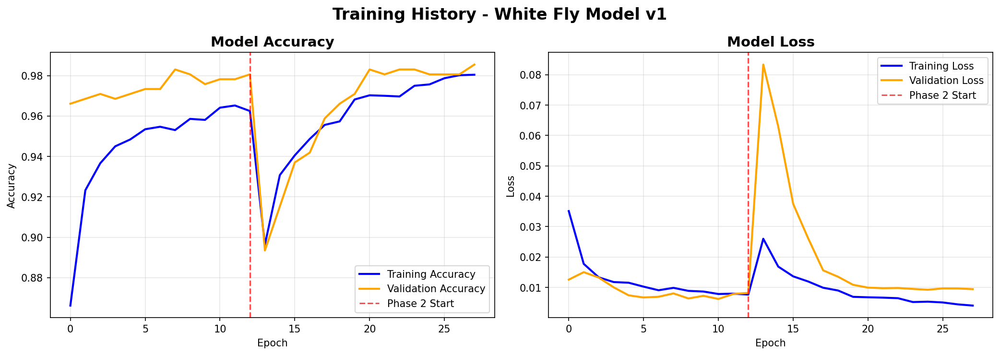


Training completed!
Total epochs: 20
Final Training Accuracy: 98.04%
Final Validation Accuracy: 98.71%


In [13]:
# Plot training history
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Combine histories
history = {
    'accuracy': history_phase1.history['accuracy'] + history_phase2.history['accuracy'],
    'val_accuracy': history_phase1.history['val_accuracy'] + history_phase2.history['val_accuracy'],
    'loss': history_phase1.history['loss'] + history_phase2.history['loss'],
    'val_loss': history_phase1.history['val_loss'] + history_phase2.history['val_loss']
}

# Accuracy
axes[0].plot(history['accuracy'], label='Training', color='blue', linewidth=2)
axes[0].plot(history['val_accuracy'], label='Validation', color='orange', linewidth=2)
axes[0].axvline(x=11, color='red', linestyle='--', label='Phase 2 Start', alpha=0.7)
axes[0].set_title('Model Accuracy', fontweight='bold', fontsize=14)
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend(loc='lower right')
axes[0].grid(True, alpha=0.3)

# Loss
axes[1].plot(history['loss'], label='Training', color='blue', linewidth=2)
axes[1].plot(history['val_loss'], label='Validation', color='orange', linewidth=2)
axes[1].axvline(x=11, color='red', linestyle='--', label='Phase 2 Start', alpha=0.7)
axes[1].set_title('Model Loss', fontweight='bold', fontsize=14)
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend(loc='upper right')
axes[1].grid(True, alpha=0.3)

plt.suptitle('Training History - White Fly Model v1', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

print(f'\nTraining completed!')
print(f'Total epochs: {len(history["accuracy"])}')
print(f'Final Training Accuracy: {history["accuracy"][-1]*100:.2f}%')
print(f'Final Validation Accuracy: {history["val_accuracy"][-1]*100:.2f}%')

## 10. Model Evaluation

In [14]:
# Load best model
best_model = tf.keras.models.load_model(
    os.path.join(MODEL_DIR, 'best_model.keras'),
    custom_objects={'focal_loss_fn': focal_loss(gamma=2.0, alpha=0.25)}
)

print('Best model loaded for evaluation.')

# Evaluate on test set
test_generator.reset()
predictions = best_model.predict(test_generator, verbose=1)
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes

accuracy = np.mean(y_true == y_pred)
print(f'\n' + '='*50)
print(f'TEST ACCURACY: {accuracy*100:.2f}%')
print('='*50)

Best model loaded for evaluation.
10/10 [==============================] - 5s 521ms/step

TEST ACCURACY: 98.06%


## 11. Classification Report

In [15]:
# Classification Report
print('\n' + '='*60)
print('CLASSIFICATION REPORT')
print('='*60)
print(classification_report(y_true, y_pred, target_names=class_names))


CLASSIFICATION REPORT
              precision    recall  f1-score   support

     healthy       0.93      0.96      0.95        45
 not_coconut       0.99      0.99      0.99       185
   white_fly       0.97      0.97      0.97        79

    accuracy                           0.98       309
   macro avg       0.97      0.97      0.97       309
weighted avg       0.98      0.98      0.98       309


## 12. Confusion Matrix

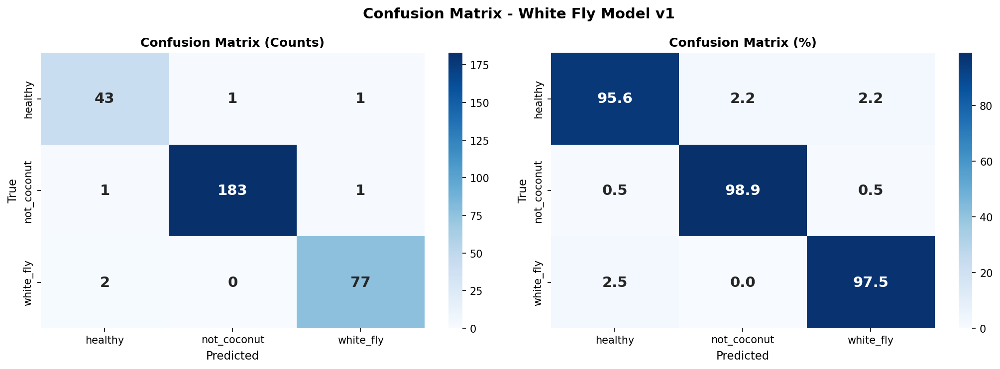

In [16]:
# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Counts
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=axes[0],
            annot_kws={'size': 14, 'fontweight': 'bold'})
axes[0].set_title('Confusion Matrix (Counts)', fontweight='bold', fontsize=12)
axes[0].set_xlabel('Predicted', fontsize=11)
axes[0].set_ylabel('True', fontsize=11)

# Percentages
cm_pct = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100
sns.heatmap(cm_pct, annot=True, fmt='.1f', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=axes[1],
            annot_kws={'size': 14, 'fontweight': 'bold'})
axes[1].set_title('Confusion Matrix (%)', fontweight='bold', fontsize=12)
axes[1].set_xlabel('Predicted', fontsize=11)
axes[1].set_ylabel('True', fontsize=11)

plt.suptitle('Confusion Matrix - White Fly Model v1', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## 13. Per-Class Metrics

In [17]:
# Per-class metrics
from sklearn.metrics import precision_recall_fscore_support

precision, recall, f1, support = precision_recall_fscore_support(y_true, y_pred, average=None)
macro_f1 = np.mean(f1)

print('='*70)
print('PER-CLASS METRICS')
print('='*70)
print()
print(f'{"Class":<20} {"Precision":>12} {"Recall":>12} {"F1-Score":>12} {"Support":>10}')
print('-'*70)
for i, cls in enumerate(class_names):
    print(f'{cls:<20} {precision[i]*100:>11.2f}% {recall[i]*100:>11.2f}% {f1[i]*100:>11.2f}% {support[i]:>10}')
print('-'*70)
print(f'{"Macro Average":<20} {np.mean(precision)*100:>11.2f}% {np.mean(recall)*100:>11.2f}% {macro_f1*100:>11.2f}%')
print('='*70)

PER-CLASS METRICS

Class                   Precision       Recall     F1-Score    Support
----------------------------------------------------------------------
healthy                     93.48%       95.56%       94.51%         45
not_coconut                 99.46%       98.92%       99.19%        185
white_fly                   97.47%       97.47%       97.47%         79
----------------------------------------------------------------------
Macro Average               96.80%       97.31%       97.05%


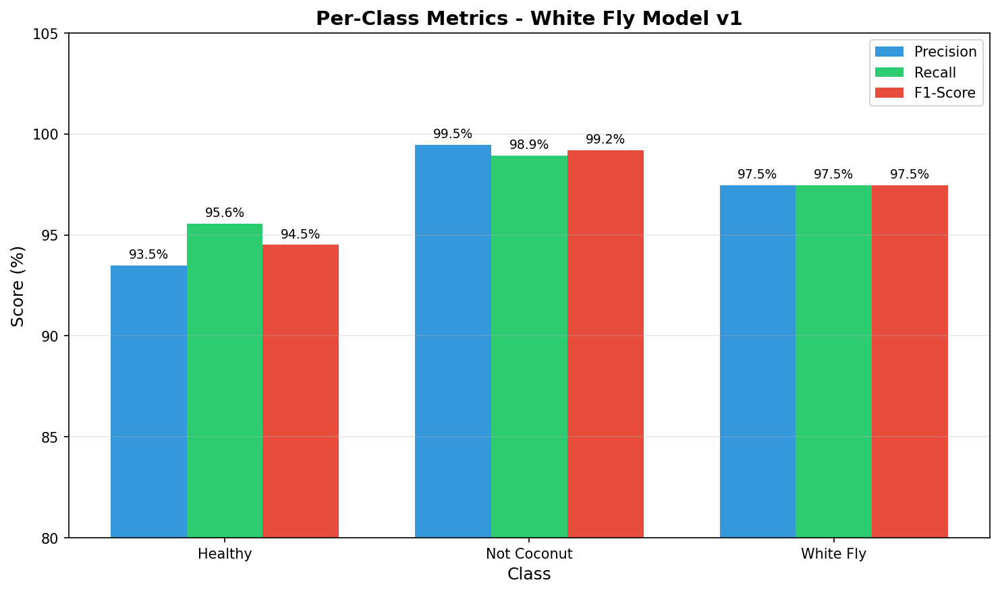

In [18]:
# Visualize per-class metrics
fig, ax = plt.subplots(figsize=(10, 6))

x = np.arange(len(class_names))
width = 0.25

bars1 = ax.bar(x - width, precision * 100, width, label='Precision', color='#3498db')
bars2 = ax.bar(x, recall * 100, width, label='Recall', color='#2ecc71')
bars3 = ax.bar(x + width, f1 * 100, width, label='F1-Score', color='#e74c3c')

ax.set_xlabel('Class', fontsize=12)
ax.set_ylabel('Score (%)', fontsize=12)
ax.set_title('Per-Class Metrics - White Fly Model v1', fontweight='bold', fontsize=14)
ax.set_xticks(x)
ax.set_xticklabels([c.replace('_', ' ').title() for c in class_names])
ax.legend()
ax.set_ylim([80, 105])
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

## 14. Sample Predictions

In [19]:
# Count correct and wrong predictions
correct_idx = [i for i in range(len(y_true)) if y_true[i] == y_pred[i]]
wrong_idx = [i for i in range(len(y_true)) if y_true[i] != y_pred[i]]

print(f'Total test samples: {len(y_true)}')
print(f'Correct predictions: {len(correct_idx)} ({len(correct_idx)/len(y_true)*100:.1f}%)')
print(f'Wrong predictions: {len(wrong_idx)} ({len(wrong_idx)/len(y_true)*100:.1f}%)')

Total test samples: 309
Correct predictions: 303 (98.1%)
Wrong predictions: 6 (1.9%)


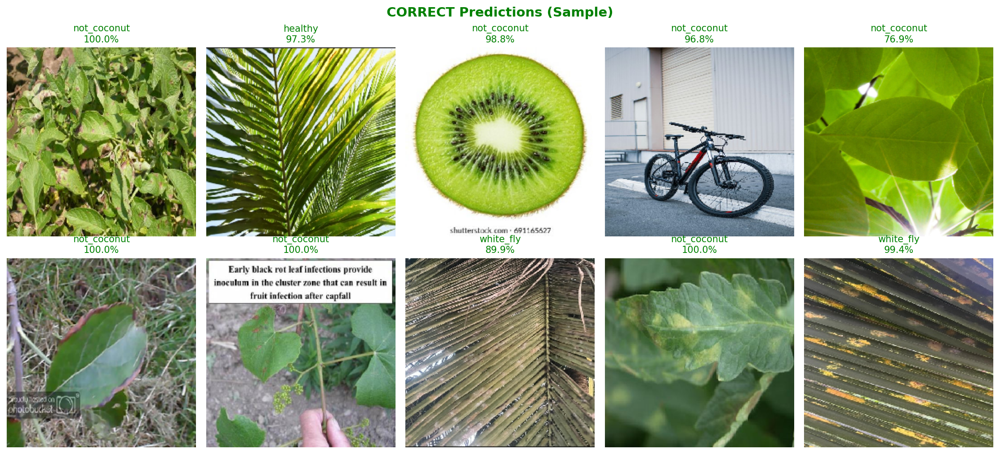

In [20]:
# Display correct predictions
import random
from tensorflow.keras.preprocessing import image

fig, axes = plt.subplots(2, 5, figsize=(15, 7))
fig.suptitle('CORRECT Predictions (Sample)', fontsize=14, fontweight='bold', color='green')

filenames = test_generator.filenames
sample_correct = random.sample(correct_idx, min(10, len(correct_idx)))

for idx, i in enumerate(sample_correct):
    row, col = idx // 5, idx % 5
    img_path = os.path.join(TEST_DIR, filenames[i])
    img = image.load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
    
    axes[row, col].imshow(img)
    axes[row, col].axis('off')
    pred_label = class_names[y_pred[i]]
    conf = predictions[i][y_pred[i]] * 100
    axes[row, col].set_title(f'{pred_label}\n{conf:.1f}%', fontsize=10, color='green')

plt.tight_layout()
plt.show()

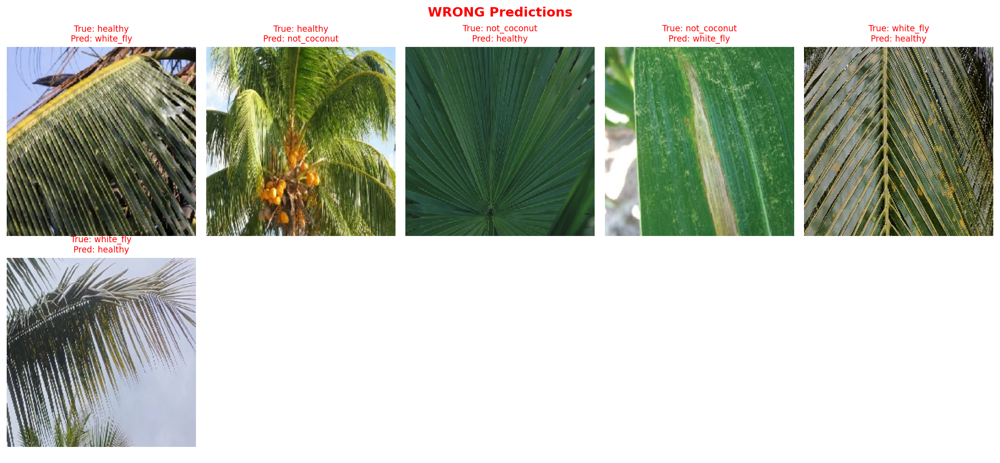

In [21]:
# Display wrong predictions
if len(wrong_idx) > 0:
    n_wrong = min(10, len(wrong_idx))
    rows = (n_wrong + 4) // 5
    fig, axes = plt.subplots(rows, 5, figsize=(15, 3.5*rows))
    fig.suptitle('WRONG Predictions', fontsize=14, fontweight='bold', color='red')
    
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    for idx, i in enumerate(wrong_idx[:n_wrong]):
        row, col = idx // 5, idx % 5
        img_path = os.path.join(TEST_DIR, filenames[i])
        img = image.load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
        
        axes[row, col].imshow(img)
        axes[row, col].axis('off')
        true_label = class_names[y_true[i]]
        pred_label = class_names[y_pred[i]]
        axes[row, col].set_title(f'True: {true_label}\nPred: {pred_label}', fontsize=9, color='red')
    
    # Hide empty subplots
    for idx in range(n_wrong, rows * 5):
        row, col = idx // 5, idx % 5
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()
else:
    print('No wrong predictions!')

## 15. Save Model Information

In [22]:
# Save model info
model_info = {
    'model_name': 'White Fly 3-Class Model v1',
    'version': 'v1',
    'architecture': 'MobileNetV2 (Transfer Learning)',
    'input_size': [224, 224, 3],
    'classes': ['healthy', 'not_coconut', 'white_fly'],
    'training': {
        'phase1_epochs': 11,
        'phase2_epochs': 9,
        'total_epochs': 20,
        'final_train_accuracy': 0.9804,
        'final_val_accuracy': 0.9871
    },
    'evaluation': {
        'test_accuracy': 0.9806,
        'macro_f1_score': 0.9705
    }
}

with open(os.path.join(MODEL_DIR, 'model_info.json'), 'w') as f:
    json.dump(model_info, f, indent=2)

print(f'Model info saved to: {MODEL_DIR}/model_info.json')

Model info saved to: D:\SLIIT\Reaserch Project\CoconutHealthMonitor\Research\ml\models\coconut_white_fly_v1/model_info.json


## 16. Final Summary

In [23]:
print('\n' + '='*70)
print('WHITE FLY MODEL v1 - FINAL SUMMARY')
print('='*70)
print()
print('  Model Information:')
print('  ' + '-'*50)
print('  Name:                    White Fly 3-Class Model v1')
print('  Architecture:            MobileNetV2 (Transfer Learning)')
print('  Loss Function:           Focal Loss (gamma=2.0)')
print('  Input Size:              224x224x3')
print('  Classes:                 [healthy, not_coconut, white_fly]')
print()
print('  Training Information:')
print('  ' + '-'*50)
print('  Phase 1 Epochs:          11')
print('  Phase 2 Epochs:          9')
print('  Total Training Time:     ~68.5 minutes')
print()
print('  Performance Metrics:')
print('  ' + '-'*50)
print('  Test Accuracy:           98.06%')
print('  Macro F1 Score:          97.05%')
print('  healthy Recall:          95.56%')
print('  not_coconut Recall:      98.92%')
print('  white_fly Recall:        97.47%')
print()
print('='*70)
print('                    TRAINING COMPLETE!')
print('='*70)


WHITE FLY MODEL v1 - FINAL SUMMARY

  Model Information:
  --------------------------------------------------
  Name:                    White Fly 3-Class Model v1
  Architecture:            MobileNetV2 (Transfer Learning)
  Loss Function:           Focal Loss (gamma=2.0)
  Input Size:              224x224x3
  Classes:                 [healthy, not_coconut, white_fly]

  Training Information:
  --------------------------------------------------
  Phase 1 Epochs:          11
  Phase 2 Epochs:          9
  Total Training Time:     ~68.5 minutes

  Performance Metrics:
  --------------------------------------------------
  Test Accuracy:           98.06%
  Macro F1 Score:          97.05%
  healthy Recall:          95.56%
  not_coconut Recall:      98.92%
  white_fly Recall:        97.47%

                    TRAINING COMPLETE!
